
# 프로젝트: 인물 모드 문제점 찾기
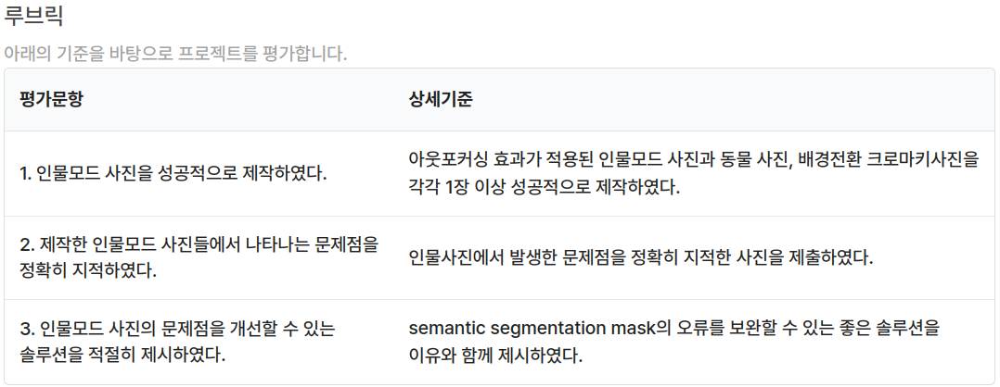   

모든 이미지는 저작권이 없는 unsplash 이미지를 사용했습니다. 

In [1]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

from importlib.metadata import version
import os
import urllib
import cv2
import numpy as np
import pixellib
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


# 1. 인물모드 직접 해 보기
- 여러분의 셀카를 이용해서 오늘 배운 내용을 수행해 봅시다. 아래와 같은 이미지를 얻어야 합니다. 최소 3장 이상의 인물모드 사진을 만들어 봅시다.
- 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다. 시맨틱 세그멘테이션 스텝에서 힌트를 찾아봅시다.
- 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다. 여러분만의 환상적인 사진을 만들어 보면 어떨까요?

## 1) 첫 번째 이미지 : 배경이 단순한 인물 사진 

(4684, 3747, 3)


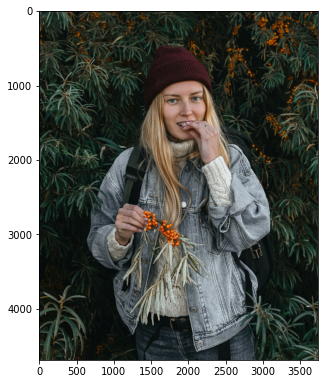

In [2]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/woman2.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [3]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f1baa6b1b80>)

In [4]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [5]:
segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [6]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

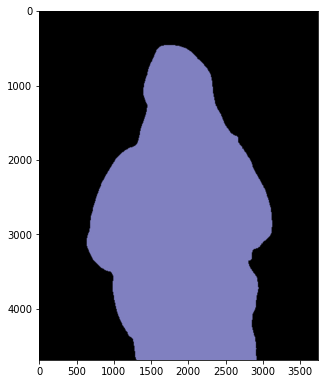

In [7]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.figure(figsize=(5,10))
plt.imshow(output)
plt.show()

In [8]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [9]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [10]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [11]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

In [12]:
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(4684, 3747)


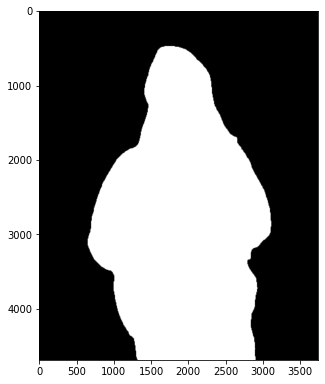

In [13]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
mask_girl = seg_map.copy()
print(seg_map.shape) 

plt.figure(figsize=(5,10))
plt.imshow(seg_map, cmap='gray')
plt.show()

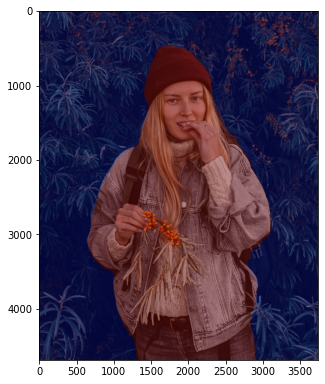

In [14]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

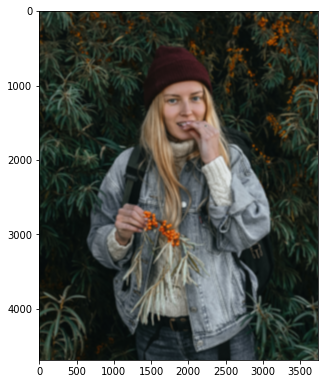

In [15]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (30,30))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

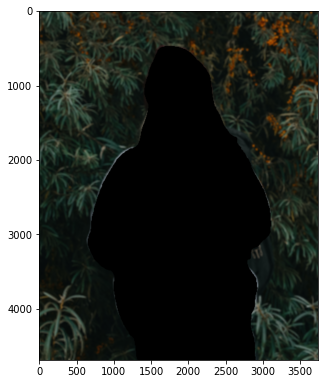

In [16]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

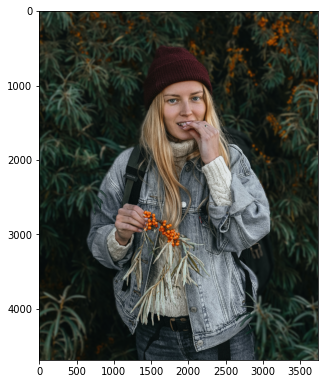

In [17]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
img_girl = img_concat.copy()
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

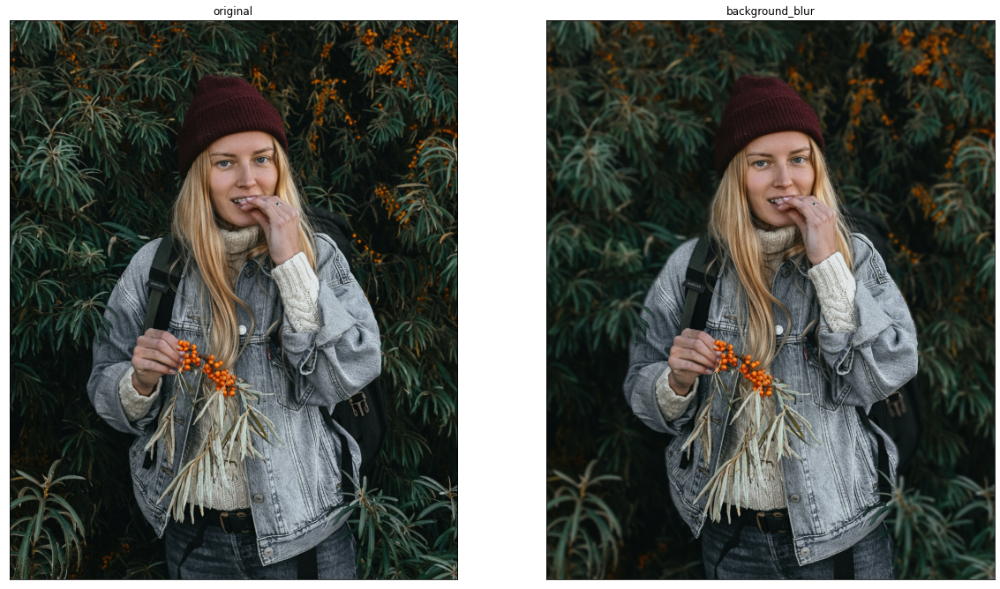

In [18]:
fig = plt.figure(figsize = (20,20))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title('original')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 
plt.title('background_blur')
plt.xticks([])
plt.yticks([])
plt.show()

Ref.   
https://inhovation97.tistory.com/56 subplot으로 이미지 여러개 출력하기    

## 이미지 배경 바꾸기 : np.where

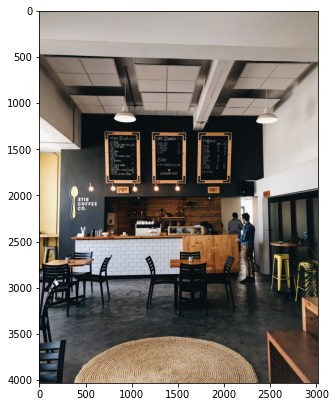

In [19]:
cafe_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cafe1.jpg'  
img_cafe = cv2.imread(cafe_path) 

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_cafe, cv2.COLOR_BGR2RGB))
plt.show()

In [20]:
print(img_cafe.shape)
print(img_orig.shape)

(4032, 3024, 3)
(4684, 3747, 3)


In [21]:
# 인물만 남기고 나머지는 0(검은색) 처리
girl_only_img_concat = np.where(img_mask_color==255, img_orig, 0)

# 이미지 resize
img_cafe_resize = cv2.resize(img_cafe, (3747, 4684)) # (y, x)순으로 

img_cafe_resize.shape

(4684, 3747, 3)

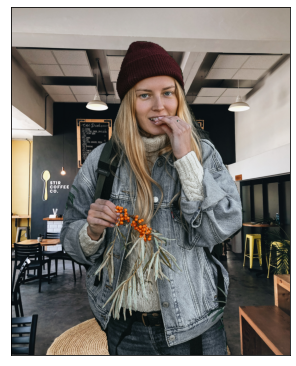

In [22]:
# 이미지 합성하기 
con = np.where(img_mask_color==255, girl_only_img_concat, img_cafe_resize)

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(con, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

## 이미지 배경 바꾸기 : copyTo

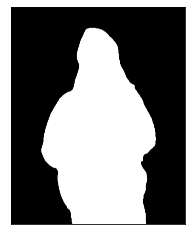

In [23]:
# plt.figure(figsize=(3,5))
plt.imshow(seg_map, cmap='gray')
plt.xticks([])
plt.yticks([])

# 보여지는 이미지를 그대로 저장(현재 디렉토리에)
plt.savefig('girl_mask.jpg') 

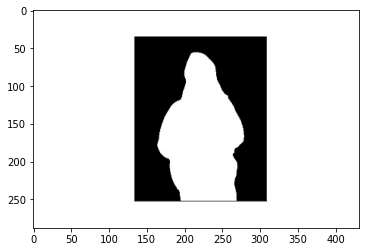

In [24]:
mask_path = os.getenv('HOME')+'/aiffel/0Going Deeper/girl_mask.jpg'  
mask_girl = cv2.imread(mask_path) 

plt.imshow(cv2.cvtColor(mask_girl, cv2.COLOR_BGR2RGB))
plt.show()

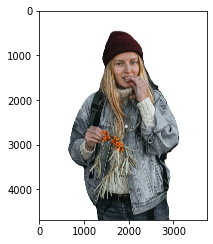

In [25]:
# 인물만 남기고 나머지는 흰색 처리
white_back_girl = np.where(img_mask_color==255, img_orig, 255)

plt.figure(figsize=(3,5))
plt.imshow(cv2.cvtColor(white_back_girl, cv2.COLOR_BGR2RGB))
plt.show()

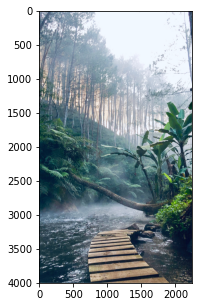

In [26]:
# 배경 이미지 불러오기 
back_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/jungle.jpg'  
jungle = cv2.imread(back_path) 

plt.figure(figsize=(3,5))
plt.imshow(cv2.cvtColor(jungle, cv2.COLOR_BGR2RGB))
plt.show()

In [27]:
white_back_girl.shape

(4684, 3747, 3)

In [28]:
mask_girl.shape

(288, 432, 3)

In [29]:
jungle.shape

(4001, 2251, 3)

In [30]:
# 이미지 사이즈 변경 
white_back_girl_resize = cv2.resize(white_back_girl, (432, 288)) # (y, x)순으로 
jungle_resize = cv2.resize(jungle, (432, 288)) 

In [31]:
# 이미지 합성 
# cv2.copyTo(white_back_girl_resize, mask_girl, jungle_resize)

# cv2.imshow('jungle', jungle_resize)

아래 블로그를 참고해서 copyTo를 이용해 배경을 바꿔보았는데, 이미지 사이즈를 줄여도 계속 copyTo에서 커널이 꺼지는 문제가 생겼다.  
또한 블로그에서는 배경보다 대상이 작아서 crop해도 괜찮았지만, 내 이미지는 배경보다 대상이 크기때문에 배경을 crop할 수 없었다.   
seg_map을 savefig로 저장해 마스크로 사용했는데, seg_map에 비해 불러온 마스크의 크기가 확연하게 작아졌다.  
어떻게하면 사이즈 그대로 저장할 수 있을까?

Ref.   
[크기가 다른 이미지로 배경 바꾸기](https://yeko90.tistory.com/entry/opencv-%EB%91%90-%EC%9D%B4%EB%AF%B8%EC%A7%80-%ED%95%A9%EC%B9%98%EB%8A%94-%EB%B0%A9%EB%B2%95-%ED%81%AC%EA%B8%B0-%EB%8B%A4%EB%A5%B8-%EC%9D%B4%EB%AF%B8%EC%A7%80) 

## 2) 두 번째 이미지 : 동물 사진 

(4032, 3024, 3)


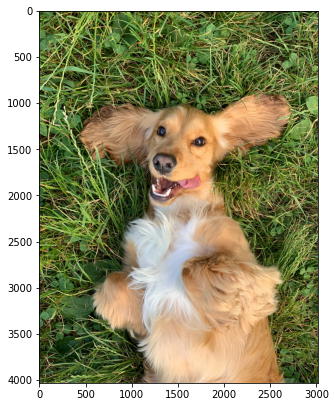

In [118]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog4.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [119]:
segvalues, output = model.segmentAsPascalvoc(img_path)

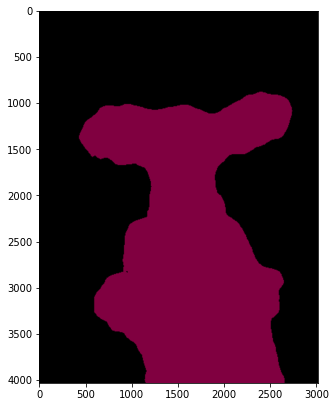

In [120]:
plt.figure(figsize=(5,10))
plt.imshow(output)
plt.show()

In [121]:
segvalues

{'class_ids': array([ 0, 12]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [122]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
dog


In [123]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [124]:
# pacalvoc에 LABEL_NAMES 12번째인 dog 
colormap[12]

array([ 64,   0, 128])

In [125]:
# colormap의 역순으로 설정 
seg_color = (128,0,64)

(4032, 3024)


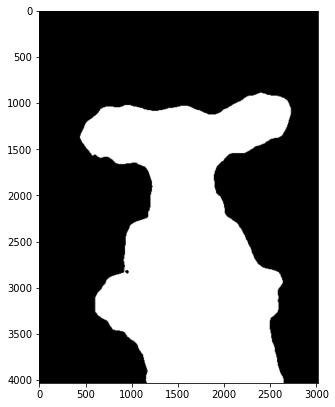

In [126]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 

plt.figure(figsize=(5,10))
plt.imshow(seg_map, cmap='gray')
plt.show()

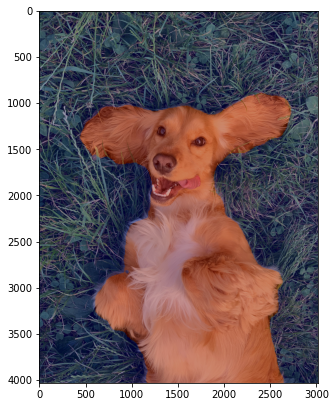

In [127]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

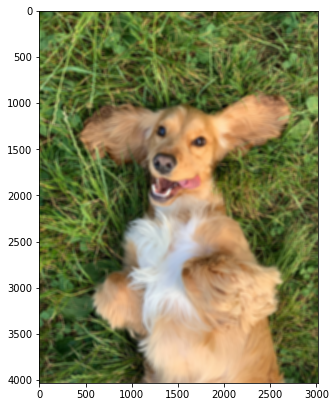

In [128]:
img_orig_blur = cv2.blur(img_orig, (35,35))
  
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

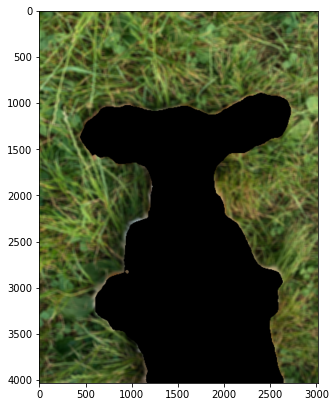

In [129]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

img_bg_mask = cv2.bitwise_not(img_mask_color)

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

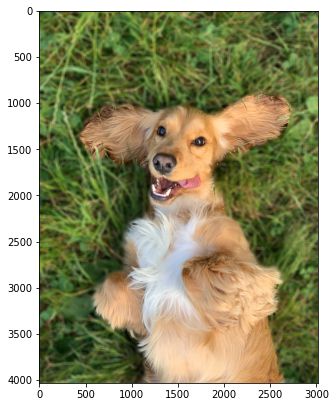

In [130]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
img_dog = img_concat.copy()

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

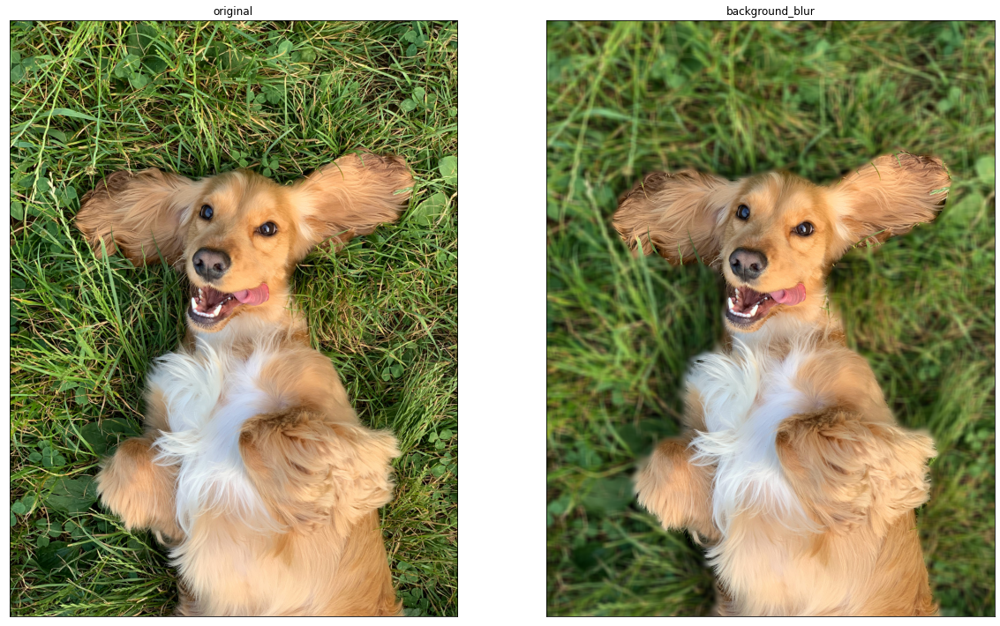

In [132]:
fig = plt.figure(figsize = (20,20))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title('original')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 
plt.title('background_blur')
plt.xticks([])
plt.yticks([])
plt.show()

귀 부분에 선명한 잔디가 섞여있어 조금 부자연스럽지만, 그래도 꽤 잘나왔다. 

## 이미지 배경 바꾸기 : np.where

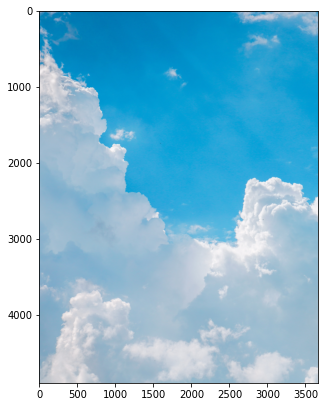

In [46]:
sky_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/sky.jpg'  
img_sky = cv2.imread(sky_path) 

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(img_sky, cv2.COLOR_BGR2RGB))
plt.show()

In [47]:
print(img_sky.shape)
print(img_orig.shape)

(4893, 3670, 3)
(4032, 3024, 3)


In [48]:
# 대상만 남기고 나머지는 0(검은색) 처리
dog_only_img_concat = np.where(img_mask_color==255, img_orig, 0)

# 이미지 resize
img_sky_resize = cv2.resize(img_sky, (3024, 4032)) 

img_sky_resize.shape

(4032, 3024, 3)

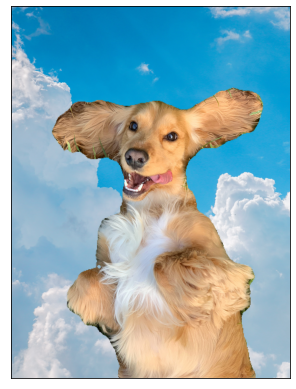

In [49]:
# 이미지 합성하기 
con = np.where(img_mask_color==255, dog_only_img_concat, img_sky_resize)

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(con, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

아무래도 강아지 윤곽선은 털 때문에 깔끔하지 않아서, 인물 합성보다 훨씬 부자연스럽다 

## 3) 세 번째 이미지 : 배경이 복잡한 인물 사진 

(2920, 4096, 3)


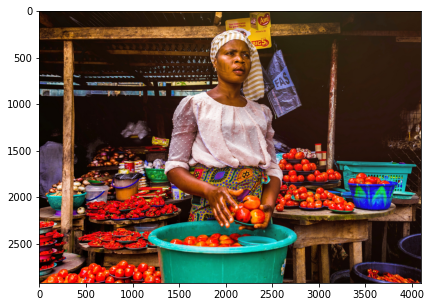

In [141]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/woman_with_background1.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [142]:
segvalues, output = model.segmentAsPascalvoc(img_path)

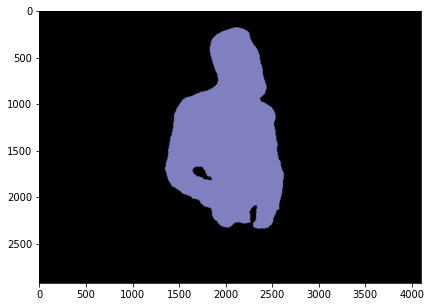

In [143]:
plt.figure(figsize=(10,5))
plt.imshow(output)
plt.show()

In [144]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [145]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [146]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [147]:
colormap[15]

array([192, 128, 128])

In [148]:
seg_color = (128,128,192)

(2920, 4096)


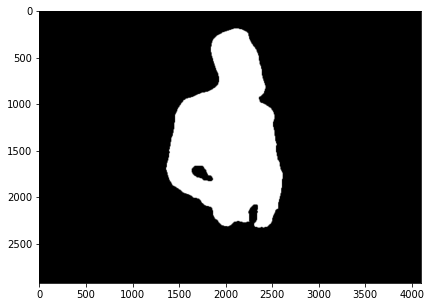

In [149]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 

plt.figure(figsize=(10,5))
plt.imshow(seg_map, cmap='gray')
plt.show()

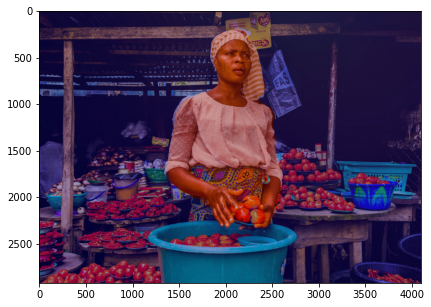

In [150]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

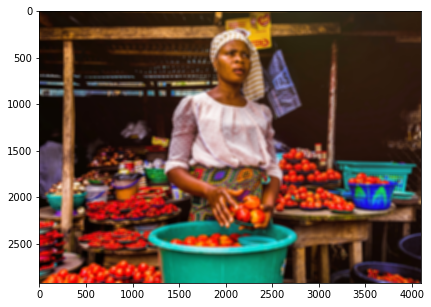

In [151]:
img_orig_blur = cv2.blur(img_orig, (35,35))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

배경이 복잡하고 배경의 요소마다 원근이 다른 두번째 사진이, 상대적으로 일정한 첫번째 사진보다 blurring kernel size를 높여야했다. 

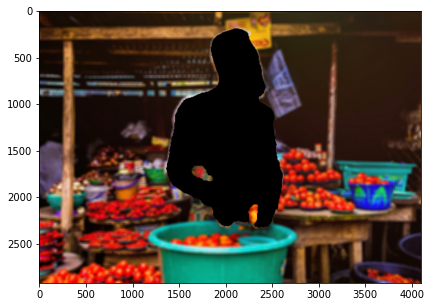

In [152]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

img_bg_mask = cv2.bitwise_not(img_mask_color)

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

배경이 일정했던 첫 번째 사진에서 segmentation이 깔끔하게 잘 됐던 반면, 두 번째 이미지에서는 아주머니의 치마 중 일부가 배경으로 인식되었다. 

In [153]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
img_woman = img_concat.copy()

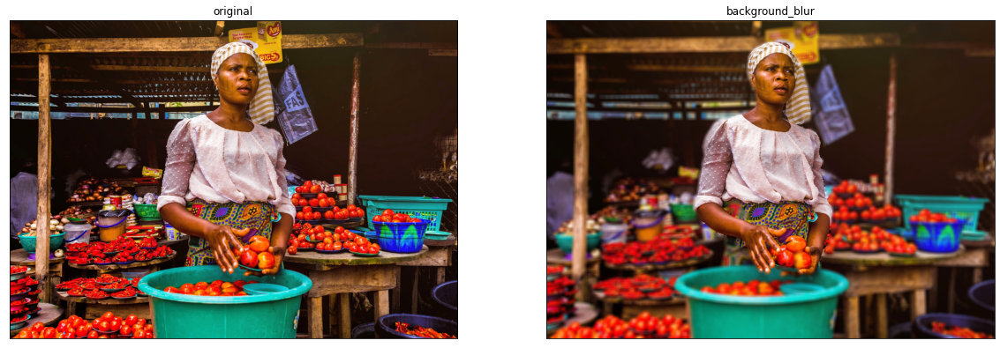

In [155]:
fig = plt.figure(figsize = (20,10))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title('original')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 
plt.title('background_blur')
plt.xticks([])
plt.yticks([])
plt.show()

## 이미지 배경 바꾸기 : np.where

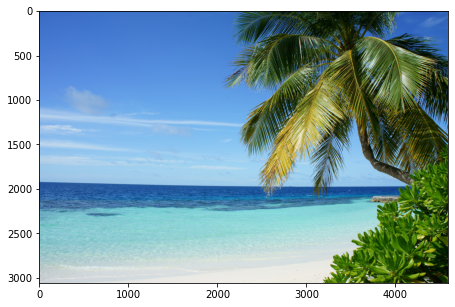

In [65]:
beach_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/beach.jpg'  
img_beach = cv2.imread(beach_path) 

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(img_beach, cv2.COLOR_BGR2RGB))
plt.show()

In [66]:
print(img_beach.shape)
print(img_orig.shape)

(3056, 4592, 3)
(2920, 4096, 3)


In [67]:
# 인물만 남기고 나머지는 0(검은색) 처리
woman_only_img_concat = np.where(img_mask_color==255, img_orig, 0)

# 이미지 resize
img_beach_resize = cv2.resize(img_beach, (4096, 2920)) # (y, x)순으로 

img_beach_resize.shape

(2920, 4096, 3)

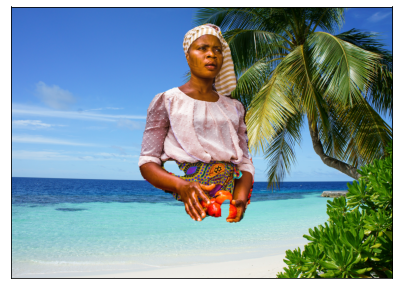

In [69]:
# 이미지 합성하기 
con = np.where(img_mask_color==255, woman_only_img_concat, img_beach_resize)

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(con, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

인물이 공중에 떠있어서 너무 부자연스럽다. 인물사진을 허리 아래로 잘라서 배경사진의 아랫부분에 붙도록 만들고 싶다.     

원본 사진을 잘라 처음부터 모든 과정을 다 진행하기는 번거롭다.     
배경이 검은 사진과, 마스크를 잘라서 사용해보자!

(1700, 2374, 3)


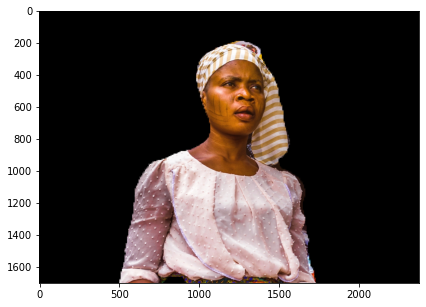

In [110]:
# 대상만 남기고 나머지는 0(검은색) 처리
woman_only_img_concat = np.where(img_mask_color==255, img_orig, 0)

# 원본 비율대로 자르기 
crop_woman = woman_only_img_concat[0:1700, 861:3235]
print(crop_woman.shape) 

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(crop_woman, cv2.COLOR_BGR2RGB))
plt.show()

(1700, 2374)


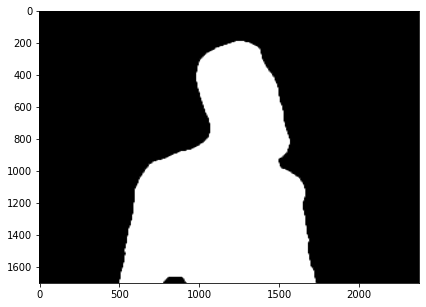

In [111]:
# 원본 비율대로 자르기 
seg_map = np.all(output==seg_color, axis=-1) 
crop_seg = seg_map[0:1700, 861:3235]
print(crop_seg.shape) 

plt.figure(figsize=(10,5))
plt.imshow(crop_seg, cmap='gray')
plt.show()

In [113]:
img_beach_resize = cv2.resize(img_beach, (2374, 1700))
img_beach_resize.shape

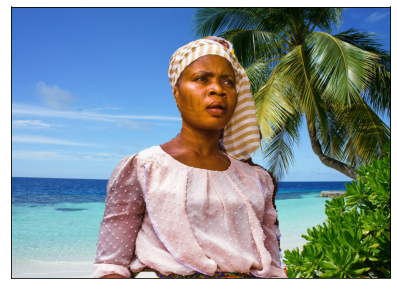

In [117]:
# 배경 합성 
img_mask = crop_seg.astype(np.uint8) * 255
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

con = np.where(img_mask_color==255, crop_woman, img_beach_resize)

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(con, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

인물이 조금 더 작고 왼쪽에 있었으면 좋았을 것 같다.   
왼쪽 어깨 부분이 원본 배경을 포함하고 있지만, 그래도 공중부양하던 사진보다 훨씬 자연스럽다. 

## Step 2. 사진에서 문제점 찾기
그러나 여러분들의 사진에는 무언가 문제점이 있을 것입니다.

아래 사진에도 문제점이 몇 가지 있었습니다. 예를 들어 뒤에 걸린 옷이 인물 영역에 포함되어 blur되지 않고 나온다던가 하는 경우입니다. ㅠㅠ 그 외 다른 문제들이 눈에 띄시나요? 아래 사진에는 이상한 점이 최소 2개 이상 더 있습니다. 어떤 문제가 있는지 찾아서 아래 사진처럼 표시해 봅시다.

추가로 여러분이 만들어 낸 인물 모드 사진 중 하나에서도 이상한 위치를 찾아 아래 사진처럼 표시해 봅시다. 표시한 이미지들을 jupyter notebook에 포함하여 제출해 주세요.


https://github.com/jiyeoon/aiffel/blob/master/Week8/Exploration14(2).ipynb 참고 

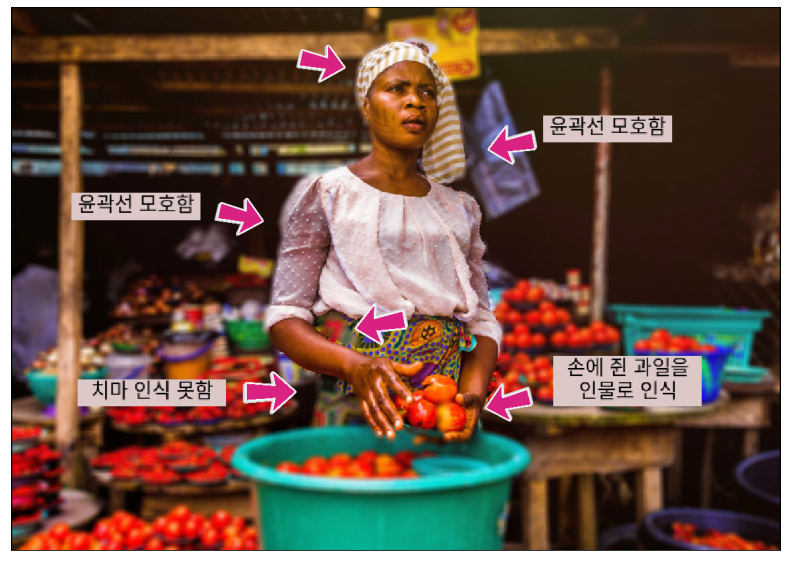

In [156]:
trouble_path1 = os.getenv('HOME')+'/aiffel/human_segmentation/images/woman_point.png'  
img_trouble1 = cv2.imread(trouble_path1) 

plt.figure(figsize=(15,10))
plt.imshow(cv2.cvtColor(img_trouble1, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

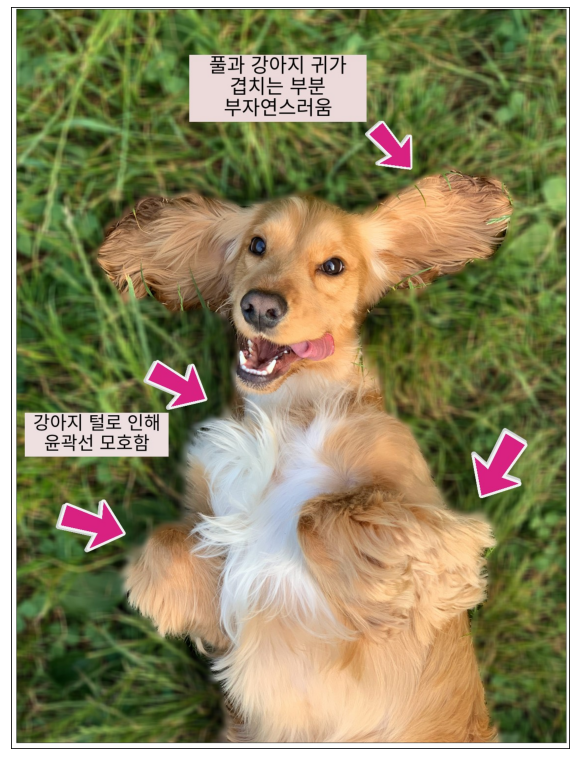

In [135]:
trouble_path2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog_point.jpg'  
img_trouble2 = cv2.imread(trouble_path2) 

plt.figure(figsize=(10,15))
plt.imshow(cv2.cvtColor(img_trouble2, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()

## Step 3. 해결 방법을 제안해 보기
노드 내용 참조 

프로젝트 노드에 여러 팁이 있으니 안 읽고 넘어가지 말것! 괜히 뻘짓함    
맨 위에 관통하는 이미지 하나(용량 잡아먹음) 

## 회고

**헤맨 부분**
- cv2.blur(img_orig, (13,13))으로 했더니 배경에 블러가 적용되지 않았다. 커널 사이즈를 (1,1)까지 줄여도 아무 변화가 없었고, (50,50)으로 늘리니 커널이 죽었다. 해당 이미지에는 (30,30)이 적당했다. 
- seg_map = np.all 부분에서 강아지 부분도 까맣게 출력되었다. label_names 에서 dogs를 찾아 colormap을 12번으로 바꿔줘야하고, 그에 따라 seg_color를 역순으로 수정해줘얀다. 사진을 바꿔도 그대로길래 노드를 다시 훑어보고 나서 깨닳았다. 
- 크로마키처럼 배경을 바꾸는 부분에서 스티커 사진 코드를 그대로 가져다 써서 오래걸렸다. 퍼실님께 여쭤본 결과 스티커 코드에서는 사람의 크기에 따라 스티커 사이즈를 조절하는 부분이 있는데, 이번에는 그게 필요없어서 계속 resize한 후에 다시 바뀌니까 에러가 난 것이었다. 

**문제를 해결하기 위한 시도와 원인 추론**
- 이미지에 새로운 배경을 합성하는 과정에서 np.where를 쓰는 코드와 copyto로 사이즈 다른 이미지 바로 합치는 코드 모두 적용해보았다. 
- 세 번째 사진에 새로운 배경을 합성 할 때, 허리 아랫부분이 부자연스러워서 이미지를 잘랐더니 합성한 사진에서 윤곽이 이상하게 따졌다. 마스크는 그대로인데 배경을 제거한 사진만 crop 하다보니 두 이미지의 위치가 일치하지 않아서 그런 것 같다.  

**새롭게 알게된 부분**
- 배경을 합성하려면 이미지 2개를 같은 사이즈로 만들어줘야한다. 
- img = cv2.resize(img, (w,h)) 수경님이 알려준 이미지 사이즈 바꾸는 코드
- plt.show() 전에 plt.xticks([]), plt.yticks([])를 넣으면, 눈금이 사라져 이미지를 더 깔끔하게 볼 수 있다. 
- [여기](https://headbreakz.tistory.com/entry/code-%EC%9D%B4%EB%AF%B8%EC%A7%80%EC%97%90%EC%84%9C-%ED%94%BD%EC%85%80-%ED%88%AC%EB%AA%85%ED%99%94-%ED%95%98%EA%B8%B0)를 참조해 배경을 투명하게 한다면 인물을 스티커처럼 새로운 배경에 합성하기 더 편할 것 같다.  

**아직도 모르는 부분**
- 
